# Karmaşık Sistemler ve Veri Bilimi Yaz Okulu - 2019


# "I dream of painting and then I paint my dream." - Vincent Van Gogh
<img src="https://www.vincentvangogh.org/images/paintings/self-portrait-with-straw-hat.jpg" width="400px" />

Tüm zamanların en iyi sanat eserlerini derin öğrenme teknikleri kullanarak sınıflandırıcı geliştirmeye çalışacağız.

Sınıflandırıcının amacı, giriş olarak verilecek bir resmin hangi sanatçı tarafından resmedildiğini tespit etmek olacak.



## Veri Kümesi

[Best Artworks of All Time](https://www.kaggle.com/ikarus777/best-artworks-of-all-time) veri kümesi, [Icaro](https://www.kaggle.com/ikarus777) adlı kullanıcının Kaggle üzerinde paylaştığı herkese açık bir veri kümesidir.

**Veri kümesinde 50 sanatçının toplam 8446 adet sanat eserlerinden oluşuyor**

**3 dosyadan oluşuyor;**

- artists.csv: Her sanatçı için bilgi tablosu.
- images.zip: Klasörlere bölünmüş ve sıralı olarak numaralandırılmış (full size) resim koleksiyonu.
- resized.zip: aynı koleksiyon ancak resimler yeniden boyutlandırıldı ve klasör yapısından çıkarıldı.




## 0. Bölüm - Veri Kümesini İndirme

**Google colab dosyalarına erişmek için doğruma yapalım**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [43]:
!ls '/content/gdrive/My Drive/'

'DeepFace Proje Dosyaları'   KaVe19	  movidius_   TR_NLP
 DL_COLAB		     LAB-CS231N   my_files


**Yeni bir çalışma klasörünü oluşturalım**

In [0]:
!mkdir '/content/gdrive/My Drive/KaVe19'

**Kaggle API ile [Best Artworks of All Time](https://www.kaggle.com/ikarus777/best-artworks-of-all-time) veri kümesini indlrmek için kurulum ve kullanıcı doğrulaması**

**Kaggle - My Account - API - Create New API Token** bölümünden kendi kullanıcınıza ait token bilgisini içeren **kaggle.json** dosyasını indirelim.

In [0]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
!echo '{"username":"komecoglu","key":"49e7ec273af489ff38e74109a9760517"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

**Veri kümesini indirmek için 'dataset' adında yeni bir klasör oluşturalım ve veri kümesini drive'ımıza indirelim**

In [0]:
!mkdir '/content/gdrive/My Drive/KaVe19/dataset'
!kaggle datasets download -d ikarus777/best-artworks-of-all-time -p '/content/gdrive/My Drive/KaVe19/dataset'

100% 2.16G/2.16G [00:26<00:00, 123MB/s]
100% 2.16G/2.16G [00:26<00:00, 86.1MB/s]


In [44]:
!ls '/content/gdrive/My Drive/KaVe19/dataset'

artists.csv  best-artworks-of-all-time.zip  images  images.zip	resized.zip


In [0]:
!unzip '/content/gdrive/My Drive/KaVe19/dataset/best-artworks-of-all-time.zip' -d '/content/gdrive/My Drive/KaVe19/dataset/'

Archive:  /content/gdrive/My Drive/KaVe19/dataset/best-artworks-of-all-time.zip
replace /content/gdrive/My Drive/KaVe19/dataset/images.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/gdrive/My Drive/KaVe19/dataset/artists.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace /content/gdrive/My Drive/KaVe19/dataset/resized.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


In [0]:
!chmod 777 '/content/gdrive/My Drive/KaVe19/dataset/images.zip' 

In [0]:
!unzip '/content/gdrive/My Drive/KaVe19/dataset/images.zip' -d '/content/gdrive/My Drive/KaVe19/dataset/'

Archive:  /content/gdrive/My Drive/KaVe19/dataset/images.zip
   creating: /content/gdrive/My Drive/KaVe19/dataset/images/
   creating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_78.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_79.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_8.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_80.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_81.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_82.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leonardo_da_Vinci/Leonardo_da_Vinci_83.jpg  
  inflating: /content/gdrive/My Drive/KaVe19/dataset/images/Leona

In [0]:
!ls '/content/gdrive/My Drive/KaVe19/dataset'

artists.csv		       images	   resized
best-artworks-of-all-time.zip  images.zip  resized.zip


In [0]:
!chmod 777 '/content/gdrive/My Drive/KaVe19/dataset/artists.csv' 

## 1. Bölüm - Veri Kümesini inceleme

In [0]:
import numpy as np
import pandas as pd 
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import os
import shutil
from glob import glob
%matplotlib inline

In [0]:
dataset_root_path = '/content/gdrive/My Drive/KaVe19/dataset/'
table_artists_path = dataset_root_path + 'artists.csv'

In [15]:
df_artists = pd.read_csv(table_artists_path)
df_artists.head()

,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70
3,3,Claude Monet,1840 - 1926,Impressionism,French,Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...,http://en.wikipedia.org/wiki/Claude_Monet,73
4,4,Rene Magritte,1898 - 1967,"Surrealism,Impressionism",Belgian,René François Ghislain Magritte (French: [ʁəne...,http://en.wikipedia.org/wiki/René_Magritte,194


In [16]:
len(df_artists)

50

In [25]:
folder_names = os.listdir(dataset_root_path + 'images')
print(folder_names)
print(len(folder_names))

['Amedeo_Modigliani', 'Vasiliy_Kandinskiy', 'Diego_Rivera', 'Claude_Monet', 'Rene_Magritte', 'Salvador_Dali', 'Edouard_Manet', 'Andrei_Rublev', 'Vincent_van_Gogh', 'Gustav_Klimt', 'Hieronymus_Bosch', 'Kazimir_Malevich', 'Mikhail_Vrubel', 'Pablo_Picasso', 'Peter_Paul_Rubens', 'Pierre-Auguste_Renoir', 'Francisco_Goya', 'Frida_Kahlo', 'El_Greco', 'Albrecht_Dürer', 'Alfred_Sisley', 'Pieter_Bruegel', 'Marc_Chagall', 'Giotto_di_Bondone', 'Sandro_Botticelli', 'Caravaggio', 'Leonardo_da_Vinci', 'Diego_Velazquez', 'Henri_Matisse', 'Jan_van_Eyck', 'Edgar_Degas', 'Rembrandt', 'Titian', 'Henri_de_Toulouse-Lautrec', 'Gustave_Courbet', 'Camille_Pissarro', 'William_Turner', 'Edvard_Munch', 'Paul_Cezanne', 'Eugene_Delacroix', 'Henri_Rousseau', 'Georges_Seurat', 'Paul_Klee', 'Piet_Mondrian', 'Joan_Miro', 'Andy_Warhol', 'Paul_Gauguin', 'Raphael', 'Michelangelo', 'Jackson_Pollock']
50


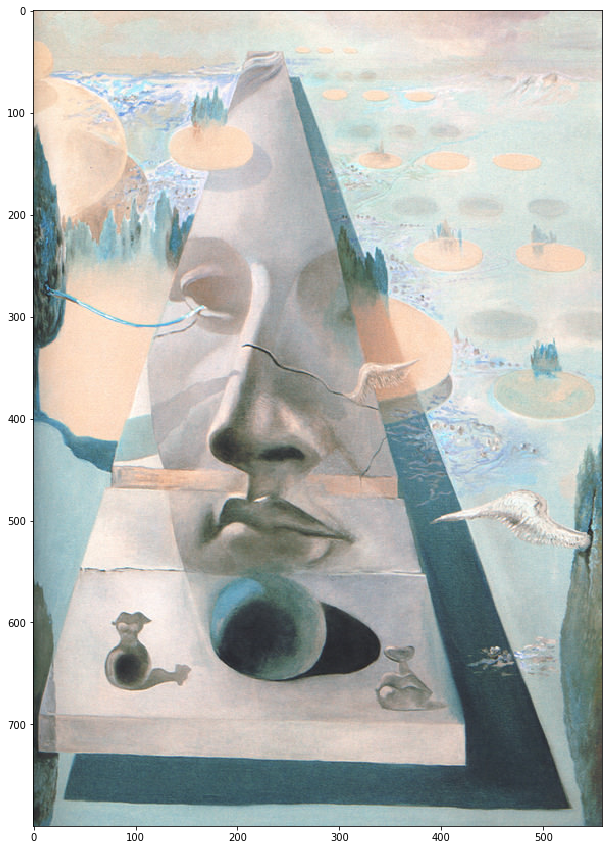

In [26]:
plt.rcParams['figure.figsize'] = (15, 15)
plt.imshow(cv2.imread(dataset_root_path + "images/Salvador_Dali/Salvador_Dali_86.jpg"))       

In [0]:
def plotImages(artist,directory):
    print(artist)
    multipleImages = glob(directory+'*.jpg')
    
    plt.rcParams['figure.figsize'] = (15, 15)
    plt.subplots_adjust(wspace=0, hspace=0)
    
    i_ = 0
    for l in multipleImages[:25]:
        #print("l",l)
        im = cv2.imread(l)
        im = cv2.resize(im, (128, 128)) 
        plt.subplot(5, 5, i_+1) #.set_title(l)
        plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')
        i_ += 1

Vincent van Gogh


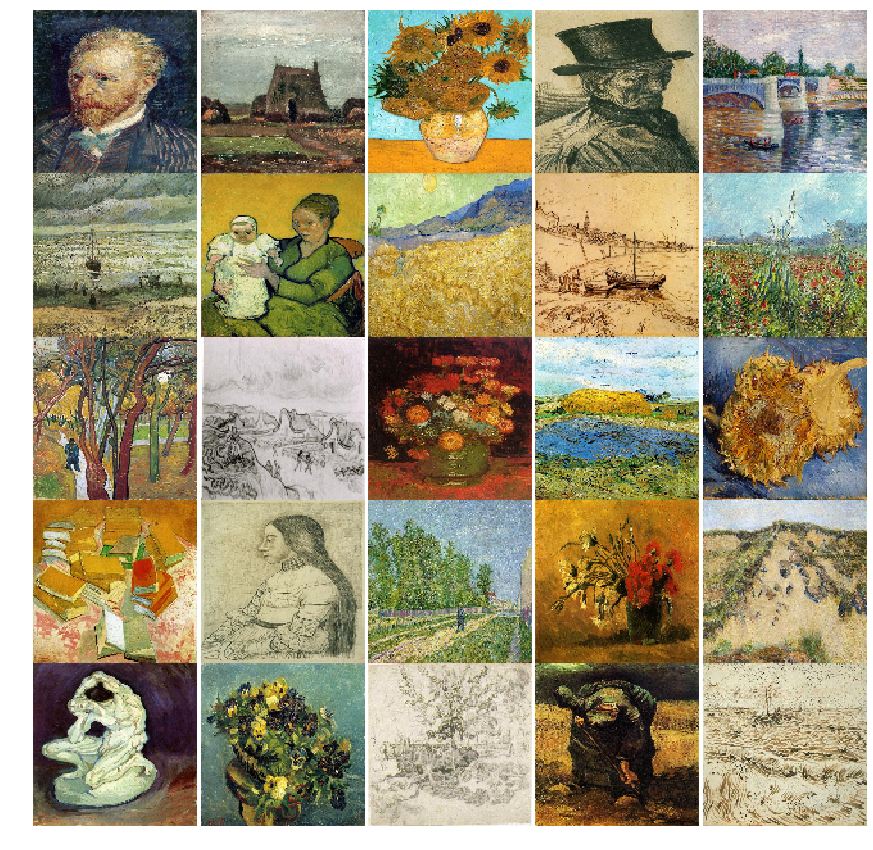

In [27]:
plotImages("Vincent van Gogh",dataset_root_path + "images/Vincent_van_Gogh/**")

Rembrandt


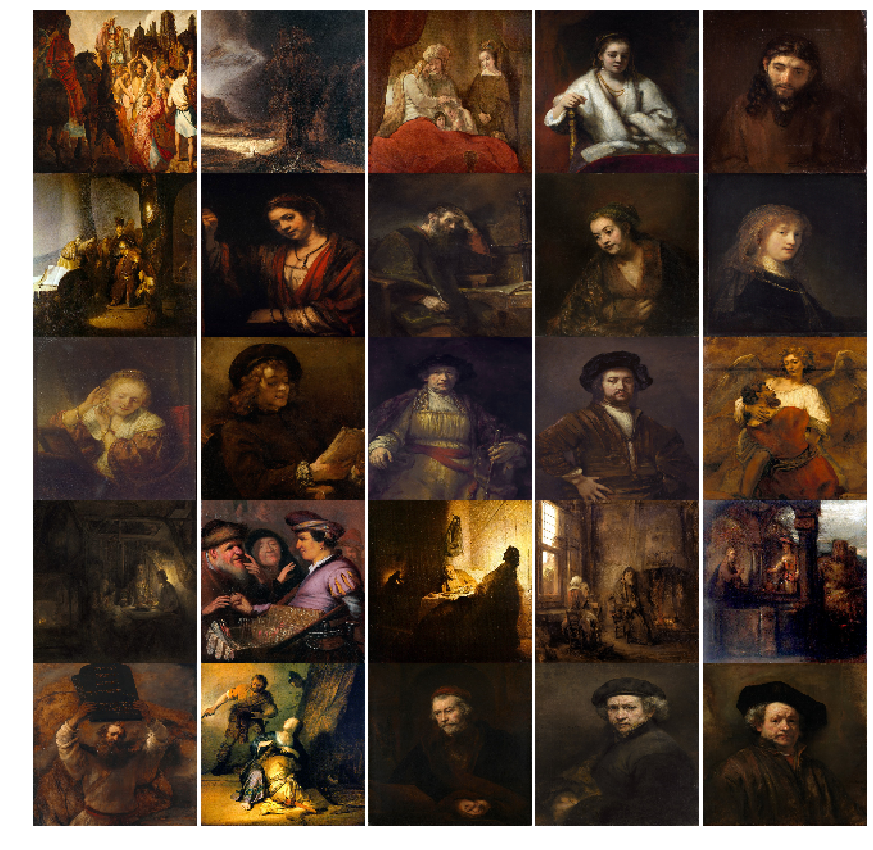

In [28]:
plotImages("Rembrandt",dataset_root_path + "images/Rembrandt/**")      

Salvador Dali


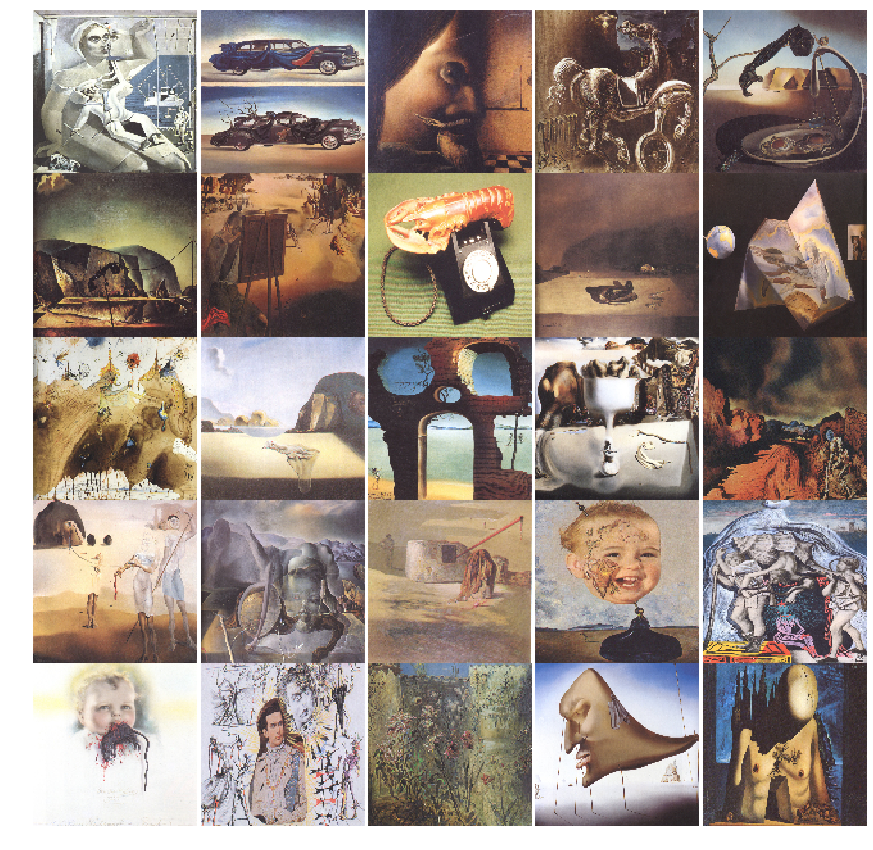

In [29]:
plotImages("Salvador Dali",dataset_root_path + "images/Salvador_Dali/**")

Pablo Picasso


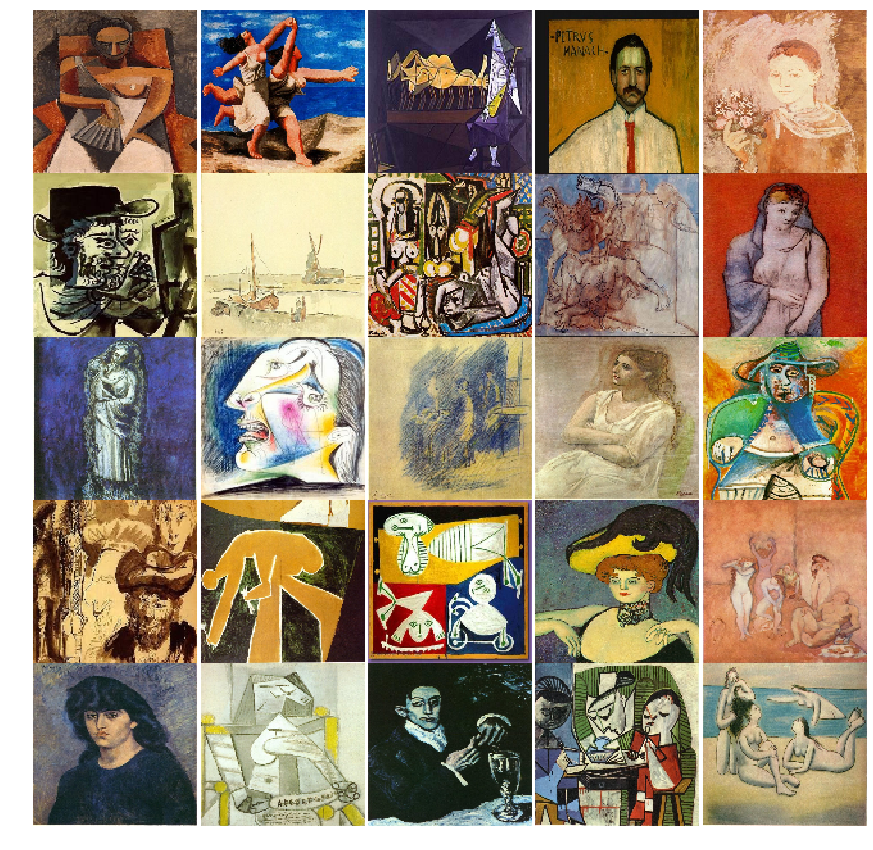

In [31]:
plotImages("Pablo Picasso",dataset_root_path + "images/Pablo_Picasso/**")  

Andy Warhol


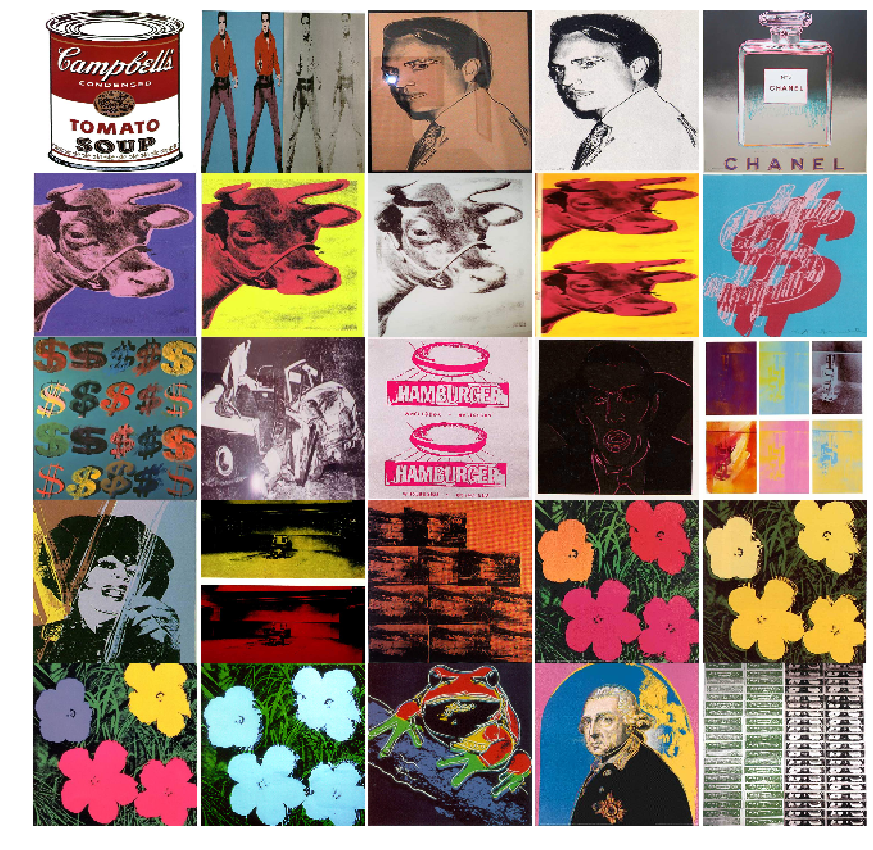

In [32]:
plotImages("Andy Warhol", dataset_root_path + "images/Andy_Warhol/**")      

Leonardo da Vinci


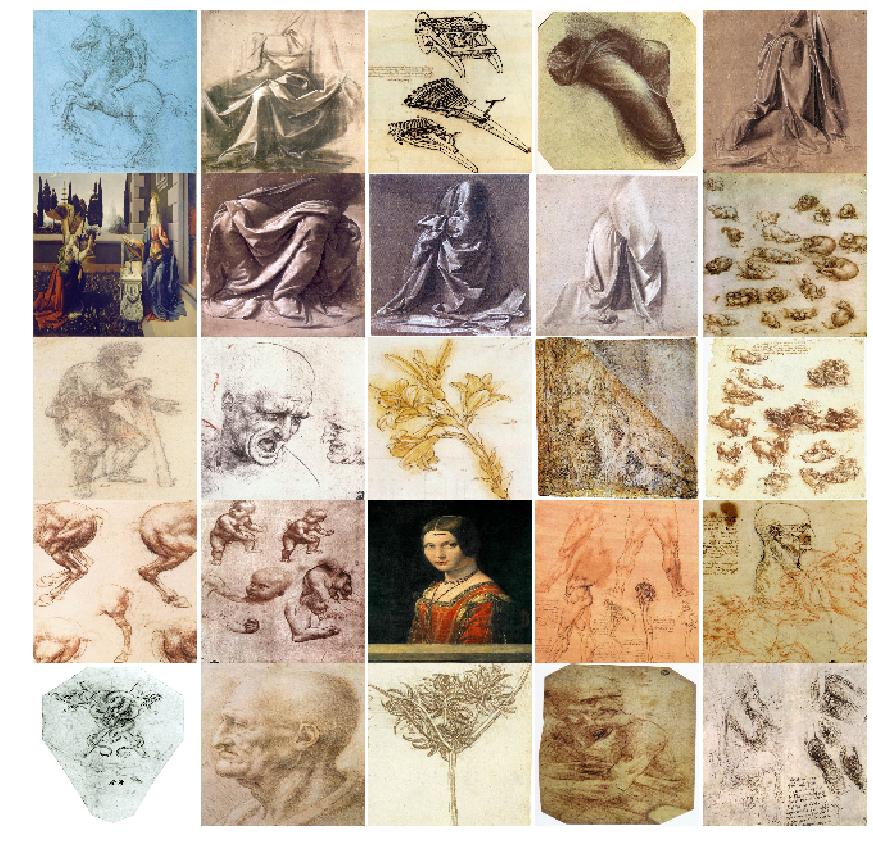

In [0]:
plotImages("Leonardo da Vinci", dataset_root_path + "images/Leonardo_da_Vinci/**")

In [45]:
df_artists_sub = df_artists[['name','paintings']]

df_artists_sub = df_artists_sub.sort_values(by=['paintings'],ascending=False)
df_artists_sub = df_artists_sub.reset_index()
df_artists_sub = df_artists_sub[['name','paintings']]

df_artists_sub

,name,paintings
0,Vincent van Gogh,877
1,Edgar Degas,702
2,Pablo Picasso,439
3,Pierre-Auguste Renoir,336
4,Albrecht Dürer,328
5,Paul Gauguin,311
6,Francisco Goya,291
7,Rembrandt,262
8,Alfred Sisley,259
9,Titian,255


In [46]:
total_paintings = df_artists_sub['paintings'].sum()
print(total_paintings)

8446


In [40]:
by_nationality = df_artists[['nationality', 'paintings']].groupby(['nationality'], as_index = False).sum()
nationality_top = by_nationality.sort_values('paintings', ascending = False)[:10]

count_names = df_artists[['nationality', 'name']].groupby(['nationality']).count()
count_names = count_names.rename({'name' : 'number of artists'}, axis=1)

nationality_top = nationality_top.join(count_names, on = 'nationality')
print(nationality_top)

                 nationality  paintings  number of artists
6                     French       2120                 13
4                      Dutch       1360                  4
15                   Spanish       1099                  5
11                   Italian       1087                  8
14                   Russian        484                  4
5                    Flemish        356                  3
9                     German        328                  1
7             French,British        259                  1
8   French,Jewish,Belarusian        239                  1
0                   American        205                  2


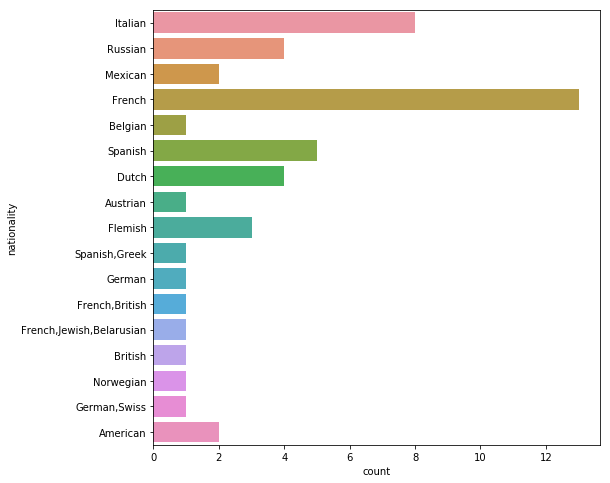

In [41]:
plt.figure(figsize=(8,8))
nationalityPlot = sns.countplot(y='nationality',data=df_artists)
nationalityPlot